In [1]:
import numpy as np
import time
import matplotlib.pyplot as plt

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

### Naive KNN

In [2]:
import numpy as np

class KNN_naive:
    def __init__(self, n_neighbors=3):
        self.n_neighbors = n_neighbors

    def fit(self, X, y):
        self.X_train = X
        self.y_train = y

    def euclidean_distances(self, x):
        return np.sqrt(np.sum((self.X_train - x) ** 2, axis=1))

    def neighbors(self, x):
        distances = self.euclidean_distances(x)
        nearest_indices = np.argsort(distances)[:self.n_neighbors]
        return self.y_train[nearest_indices]
    
    def predict(self, X):
        predictions = []
        for x in X:
            neighbors = self.neighbors(x)
            label = np.bincount(neighbors).argmax()
            predictions.append(label)
        return np.array(predictions)


### KD Trees

In [3]:
import numpy as np

class Node:
    def __init__(self, data=None, value=None, left=None, right=None):
        self.data = data
        self.left = left  
        self.right = right
        self.value = value

class Tree:
    def __init__(self, X, y, leaf_size=20):
        self.X = X
        self.y = y
        self.leaf_size = leaf_size

    def build_tree(self, X, y, depth=0):
        if len(X) <= self.leaf_size:
            return Node(data=list([np.array(X),np.array(y)]))
        
        axis = depth % X.shape[1]
        
        sorted_indices = X[:, axis].argsort()
        X_sorted = X[sorted_indices]
        y_sorted = y[sorted_indices]
        
        median_index = len(X_sorted) // 2
        
        node = Node(value=X_sorted[median_index][axis])
        
        node.left = self.build_tree(X_sorted[:median_index], y_sorted[:median_index], depth + 1)
        node.right = self.build_tree(X_sorted[median_index:], y_sorted[median_index:], depth + 1)

        return node

    def fit(self):
        self.tree = self.build_tree(self.X, self.y)



    def find_partition(self, node, x, depth=0):
        if node is None:
            return []

        axis = depth % self.X.shape[1]
        # print(node.value)

        if node.left is None and node.right is None and node.value is None:
            return node.data
        
        elif x[axis] < node.value:
            data = self.find_partition(node.left, x, depth + 1)
        else:
            data = self.find_partition(node.right, x, depth + 1)

        return data

class KNN_KD:
    def __init__(self, leaf_size=20, n_neighbors=3):
        self.n_neighbors = n_neighbors
        self.leaf_size = leaf_size
        self.x_partition = None
        self.y_partition = None

    def fit(self, X, y):
        self.X = X
        self.y = y
        self.tree = Tree(X, y, self.leaf_size)
        self.tree.fit()

    def predict(self, X):
        predictions = []
        for x in X:
            neighbours = self.neighbours(self.tree.tree,x)
            label = np.bincount(neighbours).argmax()
            predictions.append(label)
        return np.array(predictions)

    def euclidean_distances(self, x):
        return np.sqrt(np.sum((self.x_partition - x) ** 2, axis=1))

    def neighbours(self, node, x):
        self.x_partition,self.y_partition = self.tree.find_partition(node, x)
        distances = self.euclidean_distances(x)
        # print(distances)
        nearest_indices = np.argsort(distances)[:self.n_neighbors]
        return self.y_partition[nearest_indices]


### LSH (Locality Sensitive Hashing)

In [4]:
import numpy as np

class LSH:
    def __init__(self, n_planes=2, mean=0, std=1, n_neighbours=3):
        self.n_planes = n_planes
        self.mean = mean
        self.std = std
        self.n_neighbours = n_neighbours

    # def list_to_binary(self, lst):
    #     binary_str = ''.join(map(str, lst))
    #     return int(binary_str, 2)

    def fit(self, X, y):
        d = X.shape[1] + 1  
        self.X = np.concatenate([np.ones((X.shape[0], 1)), X], axis=1)
        self.y = y
        
        self.weights = np.random.normal(loc=self.mean, scale=self.std, size=(self.X.shape[1], self.n_planes))
        
        hash_values = np.matmul(self.X, self.weights)
        hash_values = np.where(hash_values > 0, 1, 0)
        self.hash = hash_values
        # print(self.hash)

        self.data_x = {}
        self.data_y = {}
        
        for idx, binary in enumerate(self.hash):
            h = tuple(binary)
            if h not in self.data_x:
                self.data_x[h] = []
                self.data_y[h] = []
            self.data_x[h].append(self.X[idx])  
            self.data_y[h].append(y[idx])

        # print(self.data_x)
        # print(self.data_y)

    def predict(self, X):
        predictions = []
        for x in X:
            neighbours = self.neighbours(x)
            label = np.bincount(neighbours).argmax()
            predictions.append(label)
        return np.array(predictions)

    def euclidean_distances(self, x):
        distances = np.sqrt(np.sum((self.x_partition - x) ** 2, axis=1))
        return distances

    def neighbours(self, x):
        x = np.concatenate([np.ones(1),x],axis=0)
        # print(x,self.weights.shape)
        hash_value_x = np.matmul(x, self.weights)
        hash_value_x = np.where(hash_value_x > 0, 1, 0)
        # print(hash_value_x)
        binaryofx = tuple(hash_value_x)
        
        if binaryofx in self.data_x:
            self.x_partition, self.y_partition = self.data_x[binaryofx], self.data_y[binaryofx]
            distances = self.euclidean_distances(x)
            nearest_indices = np.argsort(distances)[:self.n_neighbours]
            return np.array(self.y_partition)[nearest_indices]
        else:
            self.x_partition, self.y_partition = self.X, self.y
            distances = self.euclidean_distances(x)
            nearest_indices = np.argsort(distances)[:self.n_neighbours]
            return np.array(self.y_partition)[nearest_indices]



### Testing for different N and D

In [5]:
from sklearn.datasets import make_blobs
from sklearn.model_selection import train_test_split
import numpy as np

def createDataset(noise=0.2, d=2, n_clusters=10, test_size=0.2, n_samples=300,random_state=42):
    # Generate the blobs
    X, y = make_blobs(n_samples=n_samples, centers=n_clusters, n_features=d, random_state=random_state)

    np.random.seed(random_state)
    gaussian_noise = np.random.normal(loc=0, scale=noise, size=X.shape)
    
    # Add the Gaussian noise, multiplied by a factor (noise level)
    X_noisy = X + gaussian_noise

    # Split the dataset into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X_noisy, y, test_size=test_size, random_state=random_state)

    return X_train, X_test, y_train, y_test


In [6]:
! pip install memory-profiler


In [7]:
X_train,X_test,y_train,y_test = createDataset(noise=3,d=1000,n_clusters=10,test_size=0.6,n_samples=10000)
print(X_train.shape)
print(y_train.shape)

(4000, 1000)
(4000,)


In [8]:
# n_samples = [100,1000,2000,5000,10000,20000,30000,50000]
# d_values = [1,5,10,20,30,50,100,500,1000,2000,5000,10000]
# n_planes = [1,2,5,10,15,20,50,100,500,1000,2000,5000,10000]


n_samples = [100,1000,2000,5000]
d_values = [1,2,5,10,20,30,50,100,200,500,1000]
n_planes = [2,3,4,5,10,15,20,50,100]

d=1	 samples=100	 Time taken for training: 1.6689300537109375e-06	 Time taken for quering 0.0003914833068847656	 Accuracy: 0.3
d=1	 samples=1000	 Time taken for training: 7.152557373046875e-07	 Time taken for quering 0.005644321441650391	 Accuracy: 0.2625
d=1	 samples=2000	 Time taken for training: 2.384185791015625e-07	 Time taken for quering 0.01654362678527832	 Accuracy: 0.23875
d=1	 samples=5000	 Time taken for training: 7.152557373046875e-07	 Time taken for quering 0.09250664710998535	 Accuracy: 0.249
d=2	 samples=100	 Time taken for training: 4.76837158203125e-07	 Time taken for quering 0.0002601146697998047	 Accuracy: 0.375
d=2	 samples=1000	 Time taken for training: 4.76837158203125e-07	 Time taken for quering 0.008418560028076172	 Accuracy: 0.495
d=2	 samples=2000	 Time taken for training: 4.76837158203125e-07	 Time taken for quering 0.03067183494567871	 Accuracy: 0.45625
d=2	 samples=5000	 Time taken for training: 4.76837158203125e-07	 Time taken for quering 0.181875705718994

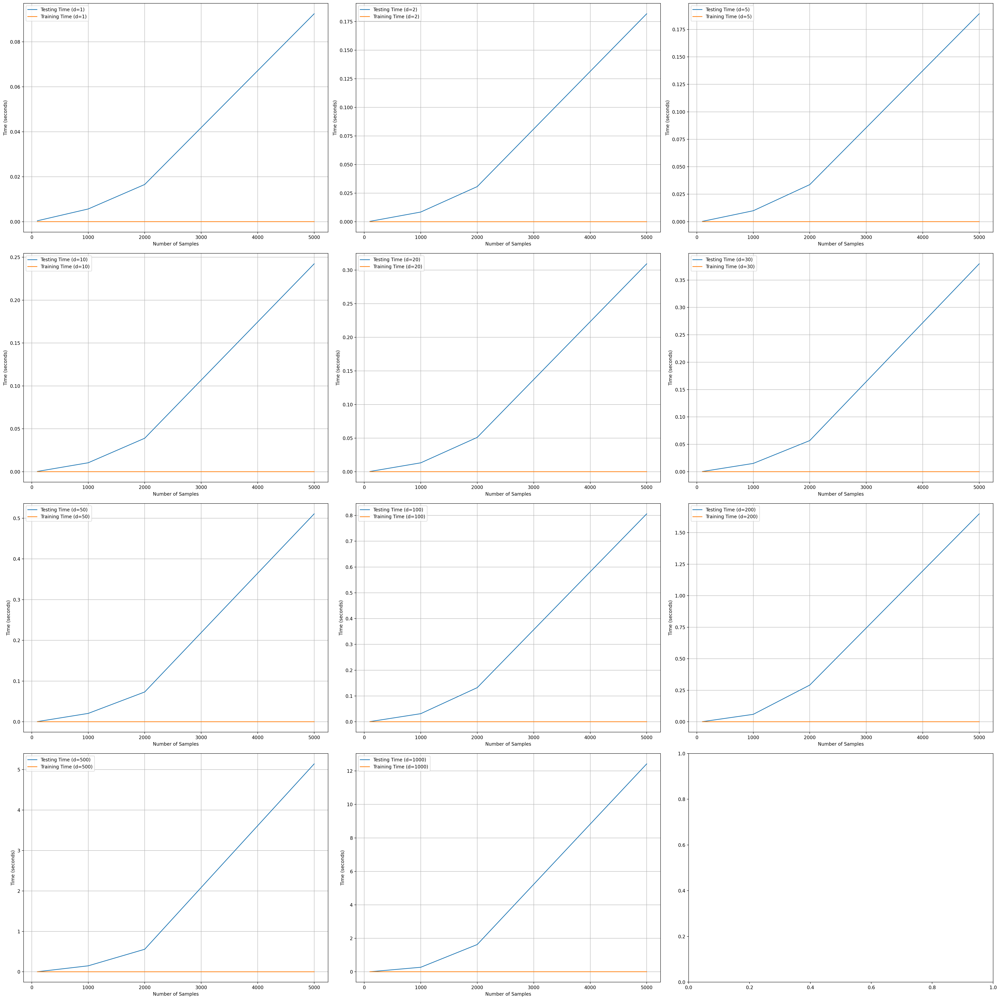

In [9]:
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

test_time = dict()
train_time = dict()

for d in d_values:
    temp_test_time = []
    temp_train_time = []
    for n_sample in n_samples:

        X_train,X_test,y_train,y_test = createDataset(noise=3,d=d,n_clusters=10,test_size=0.4,n_samples=n_sample)

        knn_naive = KNN_naive()
        t1 = time.time()
        knn_naive.fit(X_train,y_train)
        t2 = time.time()
        pred = knn_naive.predict(X_test)
        t3 = time.time()

        temp_train_time.append(t2-t1)
        temp_test_time.append(t3-t2)

        accuracy = accuracy_score(pred,y_test)
        # print(accuracy)
        print(f"d={d}\t samples={n_sample}\t Time taken for training: {t2-t1}\t Time taken for quering {t3-t2}\t Accuracy: {accuracy}")
    
    test_time[d] = temp_test_time
    train_time[d] = temp_train_time


fig, axes = plt.subplots(len(d_values)//3+1, 3, figsize=(30, 30))

axes = axes.flatten()

for i, d in enumerate(d_values):
    ax = axes[i]

    ax.plot(n_samples, test_time[d], label=f'Testing Time (d={d})')
    ax.plot(n_samples, train_time[d], label=f'Training Time (d={d})')

    ax.set_xlabel("Number of Samples")
    ax.set_ylabel("Time (seconds)")
    ax.grid()
    ax.legend()

# plt.suptitle(f"Planes", fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


d=1	 samples=100	 Time taken for training: 0.00015282630920410156	 Time taken for querying: 0.00026726722717285156	 Accuracy: 0.3
d=1	 samples=1000	 Time taken for training: 0.0004744529724121094	 Time taken for querying: 0.0024530887603759766	 Accuracy: 0.235
d=1	 samples=2000	 Time taken for training: 0.00034618377685546875	 Time taken for querying: 0.005133152008056641	 Accuracy: 0.2425
d=1	 samples=5000	 Time taken for training: 0.002282857894897461	 Time taken for querying: 0.01421666145324707	 Accuracy: 0.249
d=2	 samples=100	 Time taken for training: 4.792213439941406e-05	 Time taken for querying: 0.0002880096435546875	 Accuracy: 0.375
d=2	 samples=1000	 Time taken for training: 0.0002465248107910156	 Time taken for querying: 0.00290679931640625	 Accuracy: 0.465
d=2	 samples=2000	 Time taken for training: 0.0004284381866455078	 Time taken for querying: 0.0058345794677734375	 Accuracy: 0.47125
d=2	 samples=5000	 Time taken for training: 0.0016045570373535156	 Time taken for query

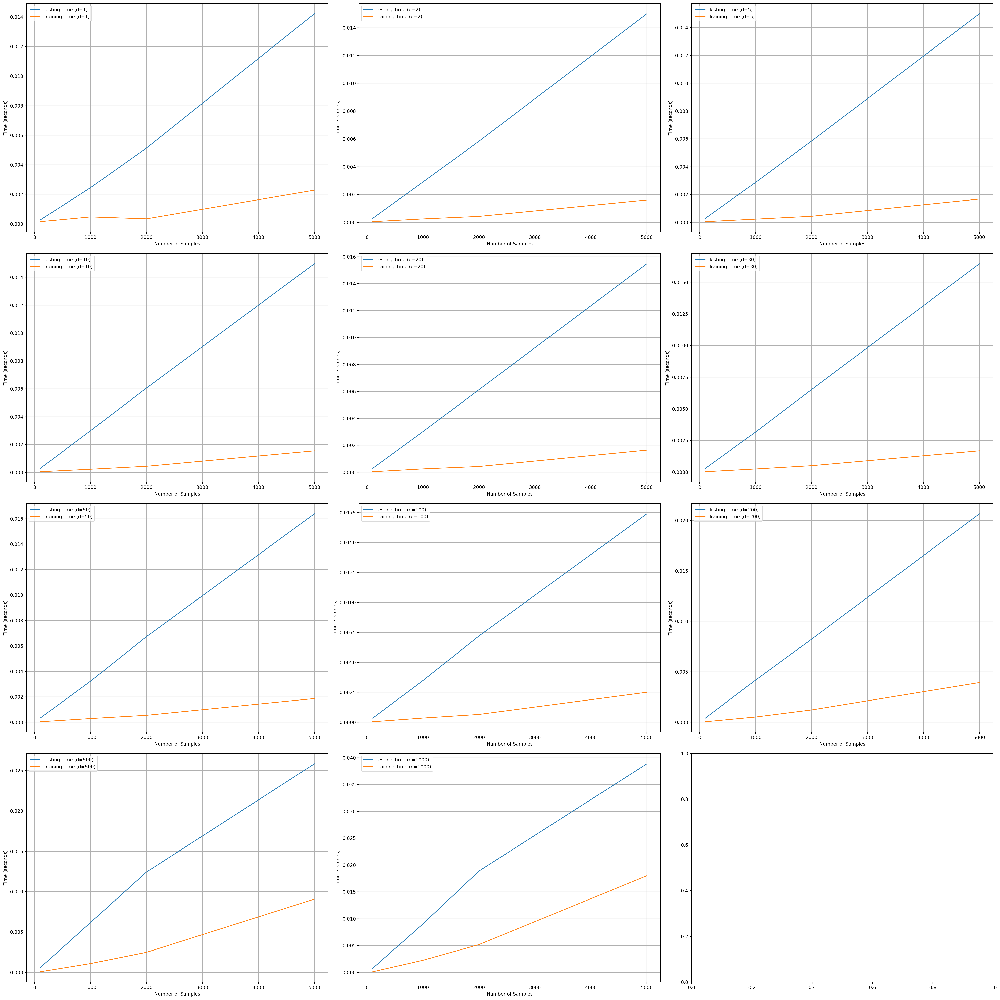

In [10]:
from sklearn.metrics import accuracy_score
import time
import matplotlib.pyplot as plt

test_time = dict()
train_time = dict()

for d in d_values:
    temp_test_time = []
    temp_train_time = []
    for n_sample in n_samples:
        X_train, X_test, y_train, y_test = createDataset(noise=3, d=d, n_clusters=10, test_size=0.4, n_samples=n_sample)

        knn_kd = KNN_KD()
        t1 = time.time()
        knn_kd.fit(X_train, y_train)
        t2 = time.time()
        pred = knn_kd.predict(X_test)
        t3 = time.time()

        temp_train_time.append(t2 - t1)
        temp_test_time.append(t3 - t2)

        accuracy = accuracy_score(pred, y_test)
        print(f"d={d}\t samples={n_sample}\t Time taken for training: {t2-t1}\t Time taken for querying: {t3-t2}\t Accuracy: {accuracy}")

    test_time[d] = temp_test_time
    train_time[d] = temp_train_time

fig, axes = plt.subplots(len(d_values)//3+1, 3, figsize=(30, 30))

axes = axes.flatten()

for i, d in enumerate(d_values):
    ax = axes[i]

    ax.plot(n_samples, test_time[d], label=f'Testing Time (d={d})')
    ax.plot(n_samples, train_time[d], label=f'Training Time (d={d})')

    ax.set_xlabel("Number of Samples")
    ax.set_ylabel("Time (seconds)")
    ax.grid()
    ax.legend()

# plt.suptitle(f"Planes", fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


planes=2 	d=1	 samples=100	 Time taken for training: 0.00024819374084472656		 Time taken for querying: 0.0028061866760253906	 Accuracy: 0.3
planes=2 	d=1	 samples=1000	 Time taken for training: 0.0013353824615478516		 Time taken for querying: 0.02539515495300293	 Accuracy: 0.2625
planes=2 	d=1	 samples=2000	 Time taken for training: 0.0012319087982177734		 Time taken for querying: 0.09388518333435059	 Accuracy: 0.24
planes=2 	d=1	 samples=5000	 Time taken for training: 0.0030961036682128906		 Time taken for querying: 0.5181756019592285	 Accuracy: 0.249
planes=2 	d=2	 samples=100	 Time taken for training: 0.00011968612670898438		 Time taken for querying: 0.0011055469512939453	 Accuracy: 0.375
planes=2 	d=2	 samples=1000	 Time taken for training: 0.0006439685821533203		 Time taken for querying: 0.01642584800720215	 Accuracy: 0.4825
planes=2 	d=2	 samples=2000	 Time taken for training: 0.0012362003326416016		 Time taken for querying: 0.06911563873291016	 Accuracy: 0.46125
planes=2 	d=2	 s

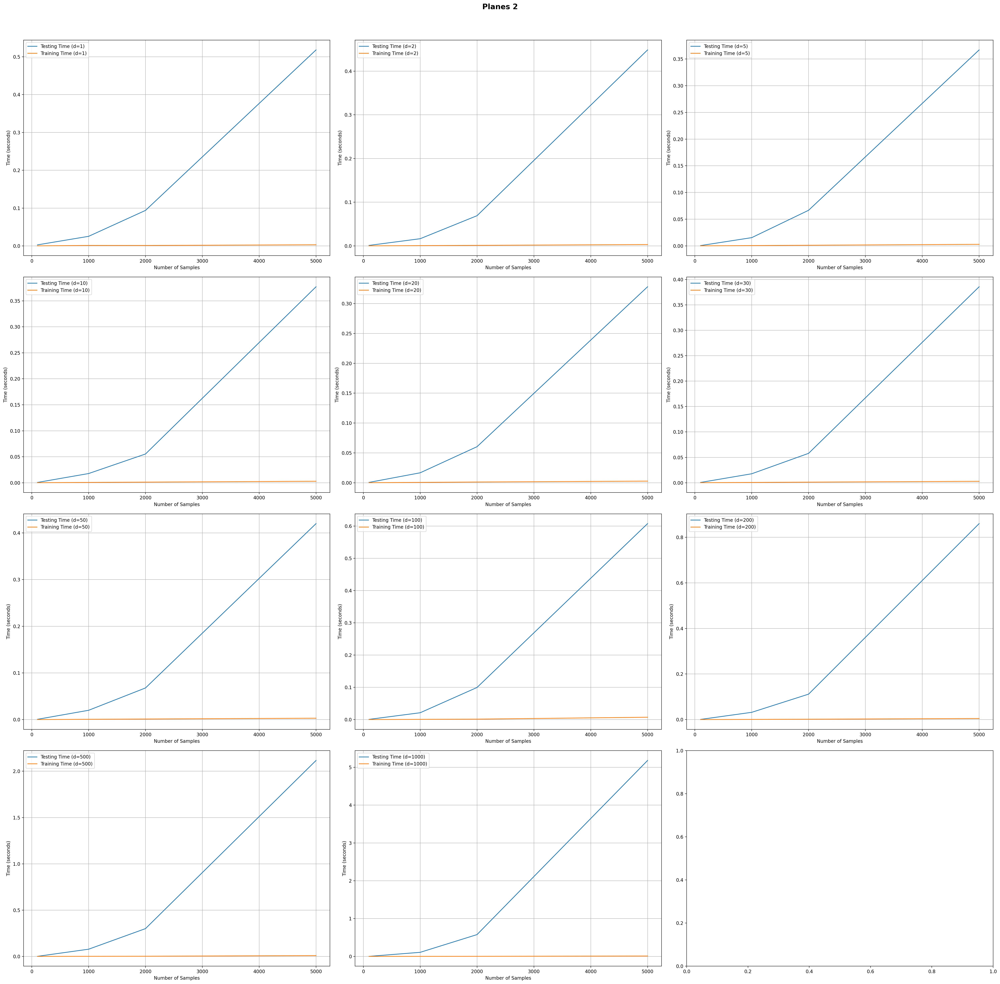

planes=3 	d=1	 samples=100	 Time taken for training: 0.00012230873107910156		 Time taken for querying: 0.0012178421020507812	 Accuracy: 0.375
planes=3 	d=1	 samples=1000	 Time taken for training: 0.0006535053253173828		 Time taken for querying: 0.020952701568603516	 Accuracy: 0.26
planes=3 	d=1	 samples=2000	 Time taken for training: 0.0014302730560302734		 Time taken for querying: 0.059563636779785156	 Accuracy: 0.23875
planes=3 	d=1	 samples=5000	 Time taken for training: 0.0032567977905273438		 Time taken for querying: 0.4623243808746338	 Accuracy: 0.2495
planes=3 	d=2	 samples=100	 Time taken for training: 0.00015664100646972656		 Time taken for querying: 0.0007708072662353516	 Accuracy: 0.325
planes=3 	d=2	 samples=1000	 Time taken for training: 0.000652313232421875		 Time taken for querying: 0.013311386108398438	 Accuracy: 0.48
planes=3 	d=2	 samples=2000	 Time taken for training: 0.001312255859375		 Time taken for querying: 0.0415034294128418	 Accuracy: 0.4525
planes=3 	d=2	 sam

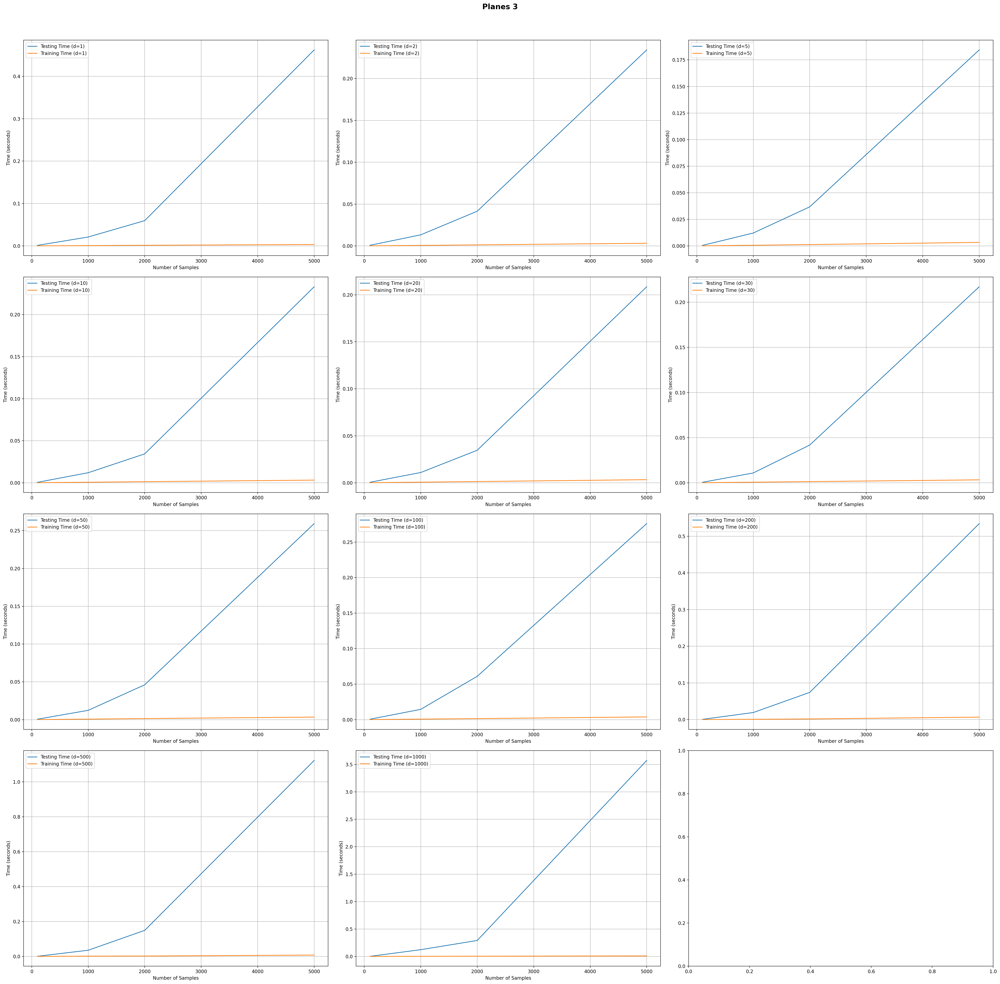

planes=4 	d=1	 samples=100	 Time taken for training: 0.00012445449829101562		 Time taken for querying: 0.0006587505340576172	 Accuracy: 0.25
planes=4 	d=1	 samples=1000	 Time taken for training: 0.0007128715515136719		 Time taken for querying: 0.02061605453491211	 Accuracy: 0.2625
planes=4 	d=1	 samples=2000	 Time taken for training: 0.0014019012451171875		 Time taken for querying: 0.08248782157897949	 Accuracy: 0.23875
planes=4 	d=1	 samples=5000	 Time taken for training: 0.003370046615600586		 Time taken for querying: 0.43291687965393066	 Accuracy: 0.249
planes=4 	d=2	 samples=100	 Time taken for training: 0.00011944770812988281		 Time taken for querying: 0.0008695125579833984	 Accuracy: 0.325
planes=4 	d=2	 samples=1000	 Time taken for training: 0.0007016658782958984		 Time taken for querying: 0.011011838912963867	 Accuracy: 0.495
planes=4 	d=2	 samples=2000	 Time taken for training: 0.001390218734741211		 Time taken for querying: 0.042415618896484375	 Accuracy: 0.455
planes=4 	d=2	

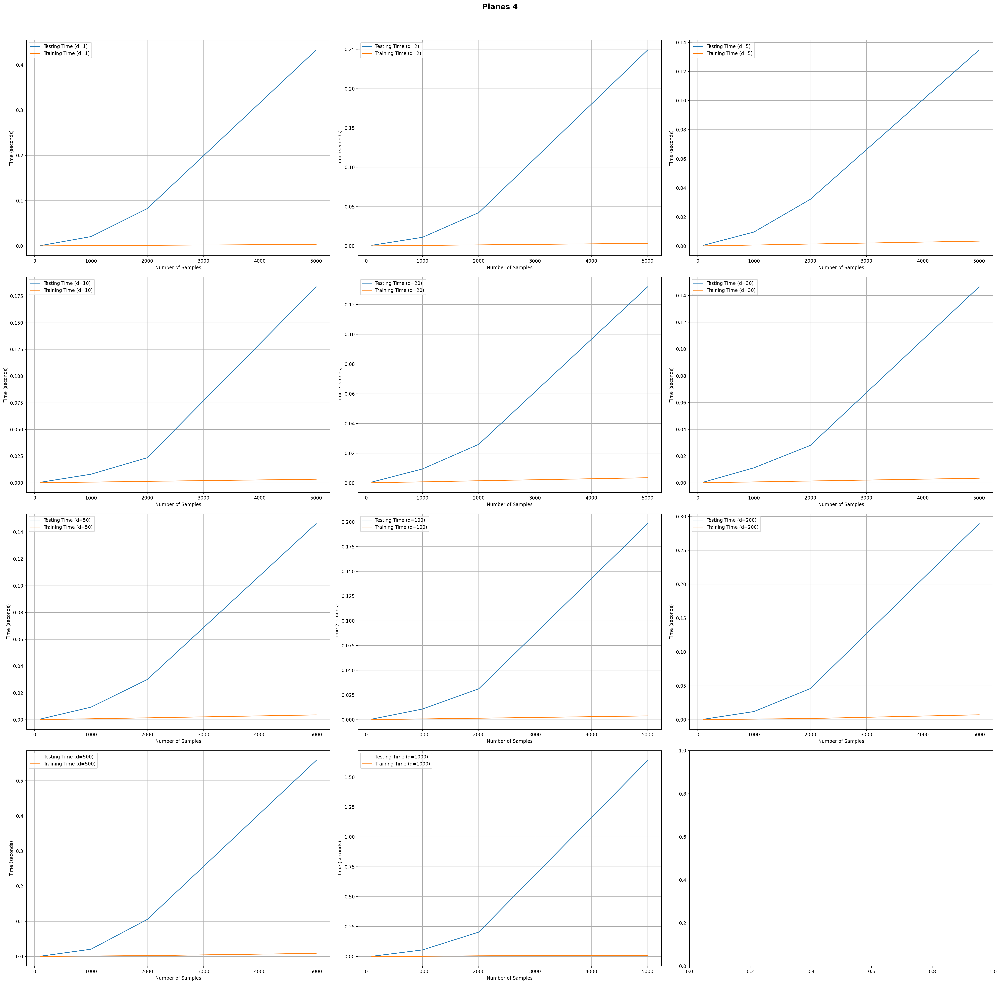

planes=5 	d=1	 samples=100	 Time taken for training: 0.00012969970703125		 Time taken for querying: 0.0007083415985107422	 Accuracy: 0.3
planes=5 	d=1	 samples=1000	 Time taken for training: 0.0007841587066650391		 Time taken for querying: 0.019179105758666992	 Accuracy: 0.26
planes=5 	d=1	 samples=2000	 Time taken for training: 0.0014791488647460938		 Time taken for querying: 0.061631202697753906	 Accuracy: 0.2375
planes=5 	d=1	 samples=5000	 Time taken for training: 0.0036978721618652344		 Time taken for querying: 0.3222081661224365	 Accuracy: 0.249
planes=5 	d=2	 samples=100	 Time taken for training: 0.0001285076141357422		 Time taken for querying: 0.0005571842193603516	 Accuracy: 0.375
planes=5 	d=2	 samples=1000	 Time taken for training: 0.0007367134094238281		 Time taken for querying: 0.01078939437866211	 Accuracy: 0.4825
planes=5 	d=2	 samples=2000	 Time taken for training: 0.001466989517211914		 Time taken for querying: 0.04295182228088379	 Accuracy: 0.4675
planes=5 	d=2	 sampl

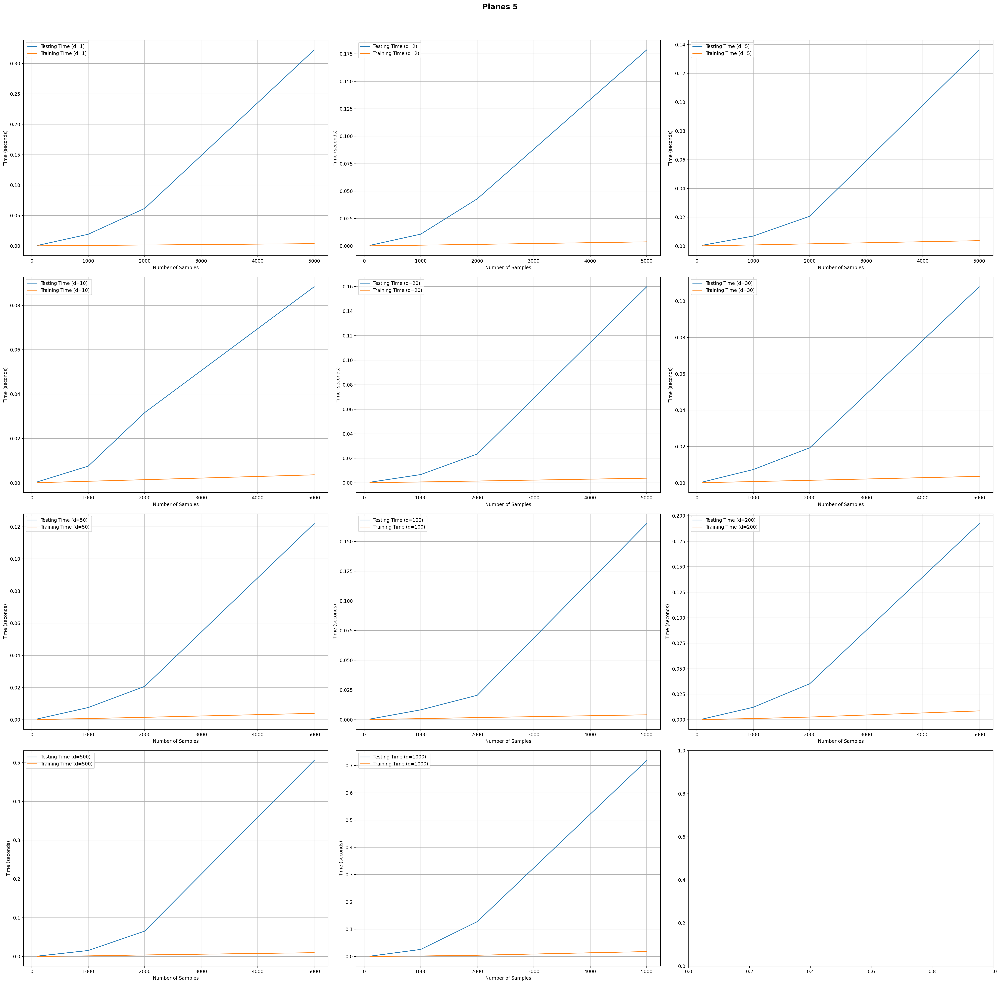

planes=10 	d=1	 samples=100	 Time taken for training: 0.0001842975616455078		 Time taken for querying: 0.0006022453308105469	 Accuracy: 0.3
planes=10 	d=1	 samples=1000	 Time taken for training: 0.0010075569152832031		 Time taken for querying: 0.016166210174560547	 Accuracy: 0.26
planes=10 	d=1	 samples=2000	 Time taken for training: 0.0022063255310058594		 Time taken for querying: 0.07337665557861328	 Accuracy: 0.23875
planes=10 	d=1	 samples=5000	 Time taken for training: 0.004436969757080078		 Time taken for querying: 0.25026440620422363	 Accuracy: 0.2495
planes=10 	d=2	 samples=100	 Time taken for training: 0.00018715858459472656		 Time taken for querying: 0.0005528926849365234	 Accuracy: 0.425
planes=10 	d=2	 samples=1000	 Time taken for training: 0.0009963512420654297		 Time taken for querying: 0.00811624526977539	 Accuracy: 0.485
planes=10 	d=2	 samples=2000	 Time taken for training: 0.001961231231689453		 Time taken for querying: 0.028027057647705078	 Accuracy: 0.4675
planes=10

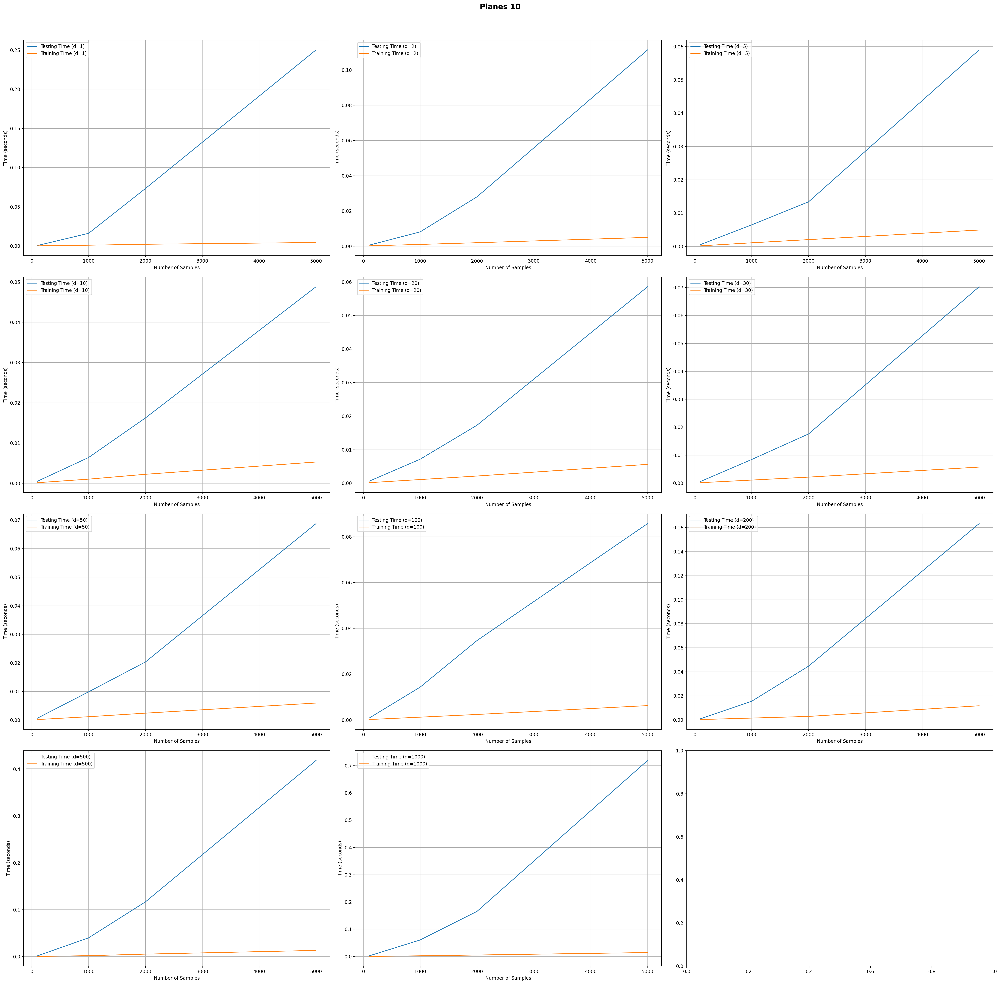

planes=15 	d=1	 samples=100	 Time taken for training: 0.00019502639770507812		 Time taken for querying: 0.0008518695831298828	 Accuracy: 0.325
planes=15 	d=1	 samples=1000	 Time taken for training: 0.001199960708618164		 Time taken for querying: 0.017426013946533203	 Accuracy: 0.2575
planes=15 	d=1	 samples=2000	 Time taken for training: 0.0025539398193359375		 Time taken for querying: 0.04361224174499512	 Accuracy: 0.24
planes=15 	d=1	 samples=5000	 Time taken for training: 0.006257534027099609		 Time taken for querying: 0.30742931365966797	 Accuracy: 0.249
planes=15 	d=2	 samples=100	 Time taken for training: 0.0003218650817871094		 Time taken for querying: 0.0005700588226318359	 Accuracy: 0.3
planes=15 	d=2	 samples=1000	 Time taken for training: 0.001234292984008789		 Time taken for querying: 0.007465362548828125	 Accuracy: 0.455
planes=15 	d=2	 samples=2000	 Time taken for training: 0.00249481201171875		 Time taken for querying: 0.020387887954711914	 Accuracy: 0.4775
planes=15 	d=

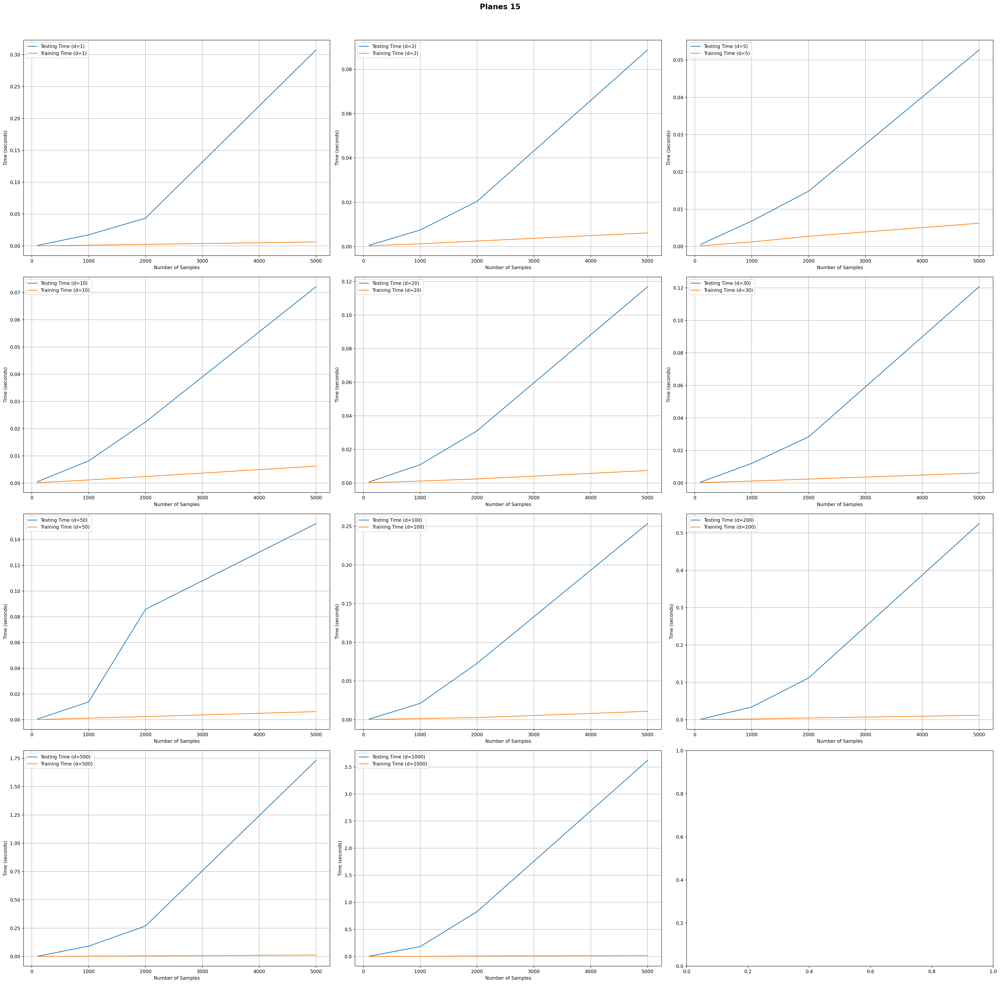

planes=20 	d=1	 samples=100	 Time taken for training: 0.0005338191986083984		 Time taken for querying: 0.001168966293334961	 Accuracy: 0.275
planes=20 	d=1	 samples=1000	 Time taken for training: 0.001338958740234375		 Time taken for querying: 0.011152505874633789	 Accuracy: 0.26
planes=20 	d=1	 samples=2000	 Time taken for training: 0.0025446414947509766		 Time taken for querying: 0.053986549377441406	 Accuracy: 0.24
planes=20 	d=1	 samples=5000	 Time taken for training: 0.006627321243286133		 Time taken for querying: 0.22109365463256836	 Accuracy: 0.246
planes=20 	d=2	 samples=100	 Time taken for training: 0.00030732154846191406		 Time taken for querying: 0.0005319118499755859	 Accuracy: 0.375
planes=20 	d=2	 samples=1000	 Time taken for training: 0.0013420581817626953		 Time taken for querying: 0.0071811676025390625	 Accuracy: 0.4825
planes=20 	d=2	 samples=2000	 Time taken for training: 0.0026929378509521484		 Time taken for querying: 0.016314268112182617	 Accuracy: 0.46
planes=20 

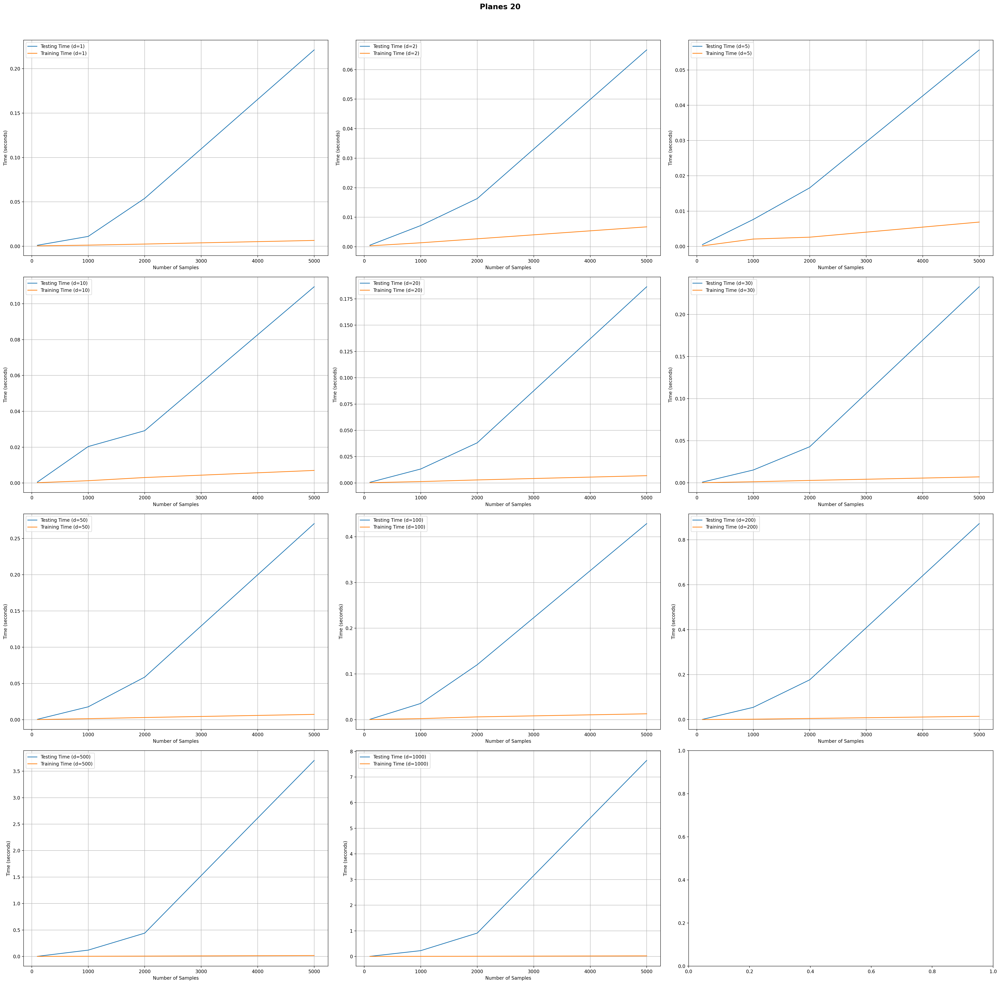

planes=50 	d=1	 samples=100	 Time taken for training: 0.0004165172576904297		 Time taken for querying: 0.0006706714630126953	 Accuracy: 0.275
planes=50 	d=1	 samples=1000	 Time taken for training: 0.002333402633666992		 Time taken for querying: 0.010193586349487305	 Accuracy: 0.255
planes=50 	d=1	 samples=2000	 Time taken for training: 0.005061626434326172		 Time taken for querying: 0.03447151184082031	 Accuracy: 0.23625
planes=50 	d=1	 samples=5000	 Time taken for training: 0.012937068939208984		 Time taken for querying: 0.10901618003845215	 Accuracy: 0.2485
planes=50 	d=2	 samples=100	 Time taken for training: 0.0003247261047363281		 Time taken for querying: 0.0005934238433837891	 Accuracy: 0.4
planes=50 	d=2	 samples=1000	 Time taken for training: 0.002415895462036133		 Time taken for querying: 0.007259368896484375	 Accuracy: 0.48
planes=50 	d=2	 samples=2000	 Time taken for training: 0.005257606506347656		 Time taken for querying: 0.016853809356689453	 Accuracy: 0.465
planes=50 	d=

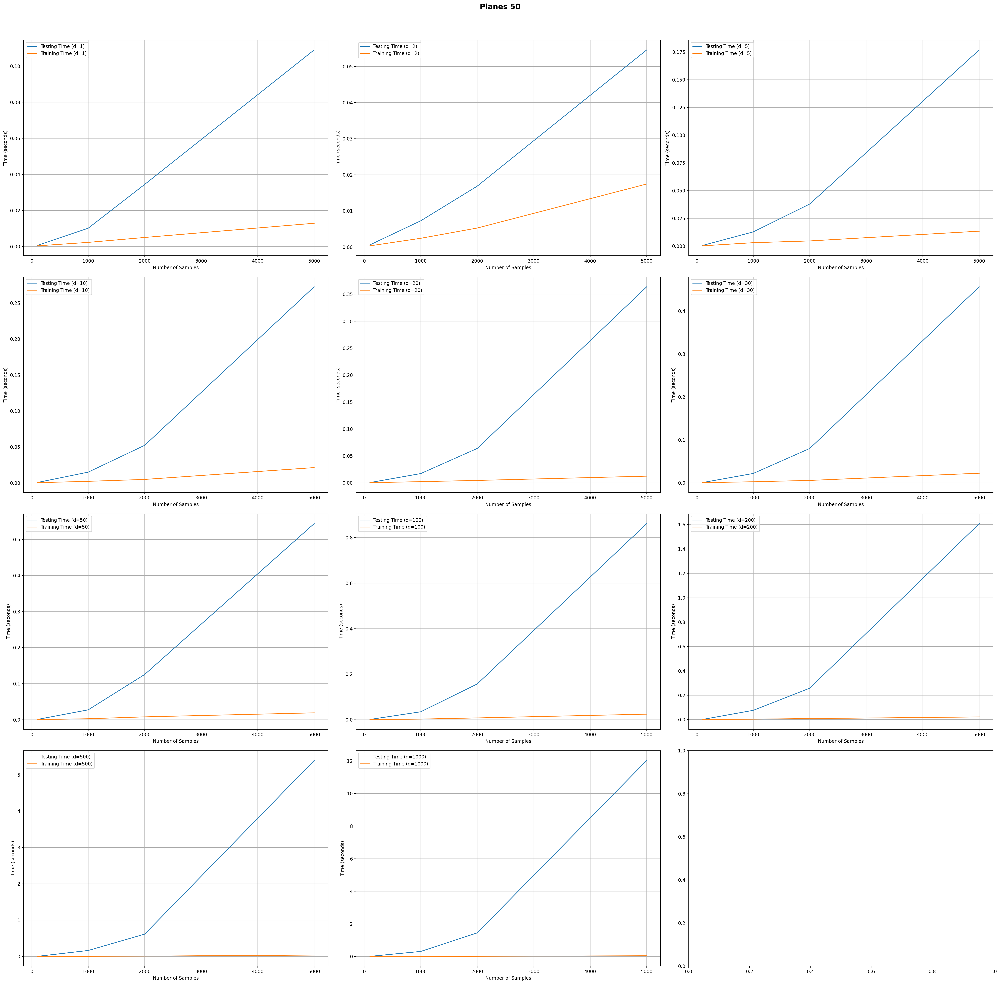

planes=100 	d=1	 samples=100	 Time taken for training: 0.0007460117340087891		 Time taken for querying: 0.0007662773132324219	 Accuracy: 0.3
planes=100 	d=1	 samples=1000	 Time taken for training: 0.004716157913208008		 Time taken for querying: 0.011522293090820312	 Accuracy: 0.255
planes=100 	d=1	 samples=2000	 Time taken for training: 0.009785175323486328		 Time taken for querying: 0.029380083084106445	 Accuracy: 0.2425
planes=100 	d=1	 samples=5000	 Time taken for training: 0.0326380729675293		 Time taken for querying: 0.11558318138122559	 Accuracy: 0.2485
planes=100 	d=2	 samples=100	 Time taken for training: 0.0004711151123046875		 Time taken for querying: 0.0006430149078369141	 Accuracy: 0.4
planes=100 	d=2	 samples=1000	 Time taken for training: 0.005397796630859375		 Time taken for querying: 0.010217666625976562	 Accuracy: 0.4825
planes=100 	d=2	 samples=2000	 Time taken for training: 0.009432792663574219		 Time taken for querying: 0.022739410400390625	 Accuracy: 0.43875
planes

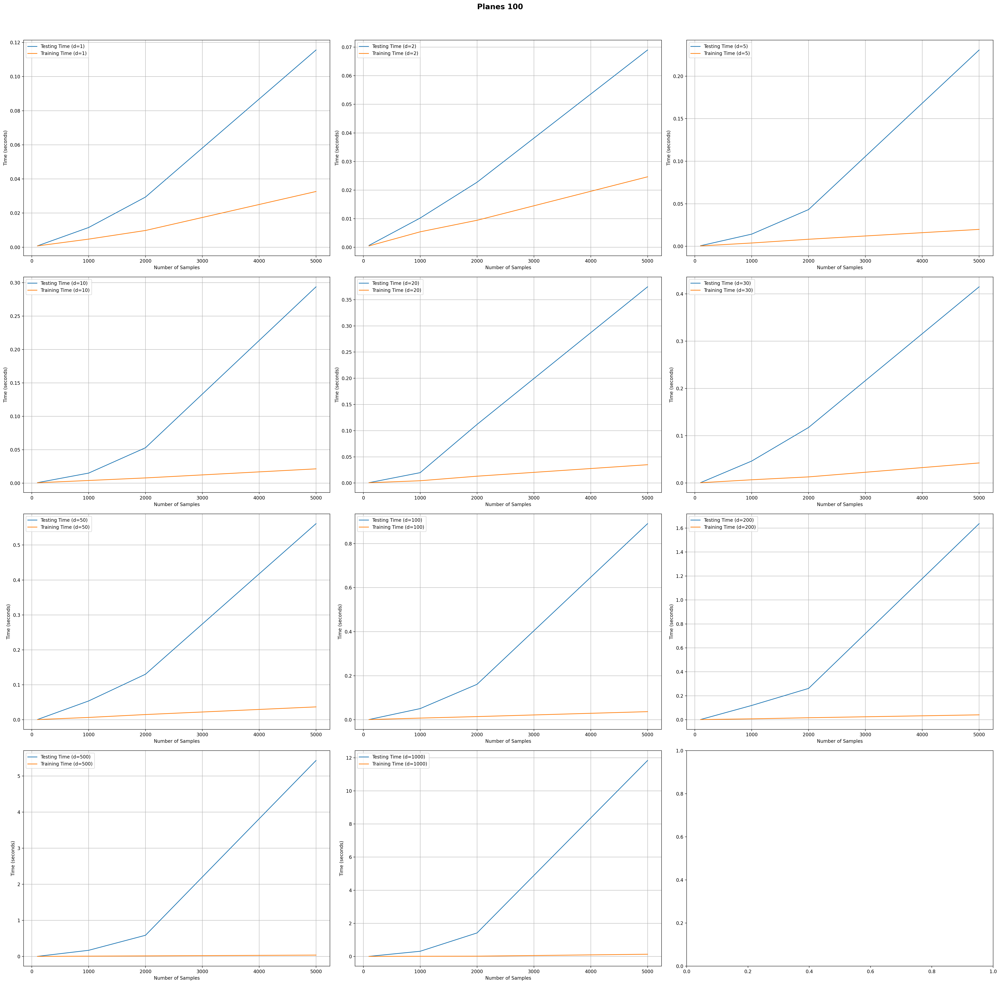

In [11]:
from sklearn.metrics import accuracy_score
import time
import matplotlib.pyplot as plt

for n_plane in n_planes:
    test_time = dict()
    train_time = dict()

    for d in d_values:
        temp_train_time = []
        temp_test_time = []
        for n_sample in n_samples:

            X_train, X_test, y_train, y_test = createDataset(noise=3, d=d, n_clusters=10, test_size=0.4, n_samples=n_sample)

            lsh = LSH(n_planes=n_plane)
            t1 = time.time()
            lsh.fit(X_train, y_train)
            t2 = time.time()
            pred = lsh.predict(X_test)
            t3 = time.time()

            temp_train_time.append(t2 - t1)
            temp_test_time.append(t3 - t2)

            accuracy = accuracy_score(pred, y_test)
            print(f"planes={n_plane} \td={d}\t samples={n_sample}\t Time taken for training: {t2-t1}\t\t Time taken for querying: {t3-t2}\t Accuracy: {accuracy}")
        
        # After processing all n_samples for a given d, store the results
        test_time[d] = temp_test_time
        train_time[d] = temp_train_time



    fig, axes = plt.subplots(len(d_values)//3+1, 3, figsize=(30, 30))

    axes = axes.flatten()

    for i, d in enumerate(d_values):
        ax = axes[i]

        ax.plot(n_samples, test_time[d], label=f'Testing Time (d={d})')
        ax.plot(n_samples, train_time[d], label=f'Training Time (d={d})')

        ax.set_xlabel("Number of Samples")
        ax.set_ylabel("Time (seconds)")
        ax.grid()
        ax.legend()

    plt.suptitle(f"Planes {n_plane}", fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()



### Visualising the approxiamtions

In [12]:
X_train,X_test,y_train,y_test = createDataset(noise=1,d=2,n_clusters=3,test_size=0.3,n_samples=200,random_state = 30)

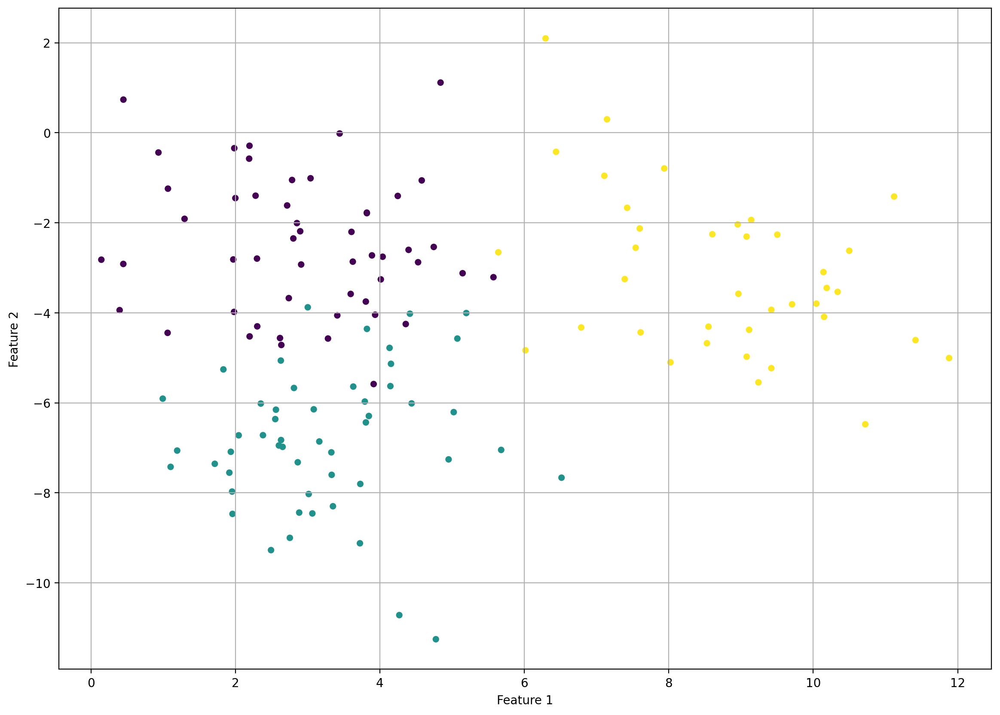

In [13]:
plt.figure(figsize=(14,10))
plt.scatter(X_train[:, 0], X_train[:, 1],c=y_train,s=20)
plt.grid()
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.show()

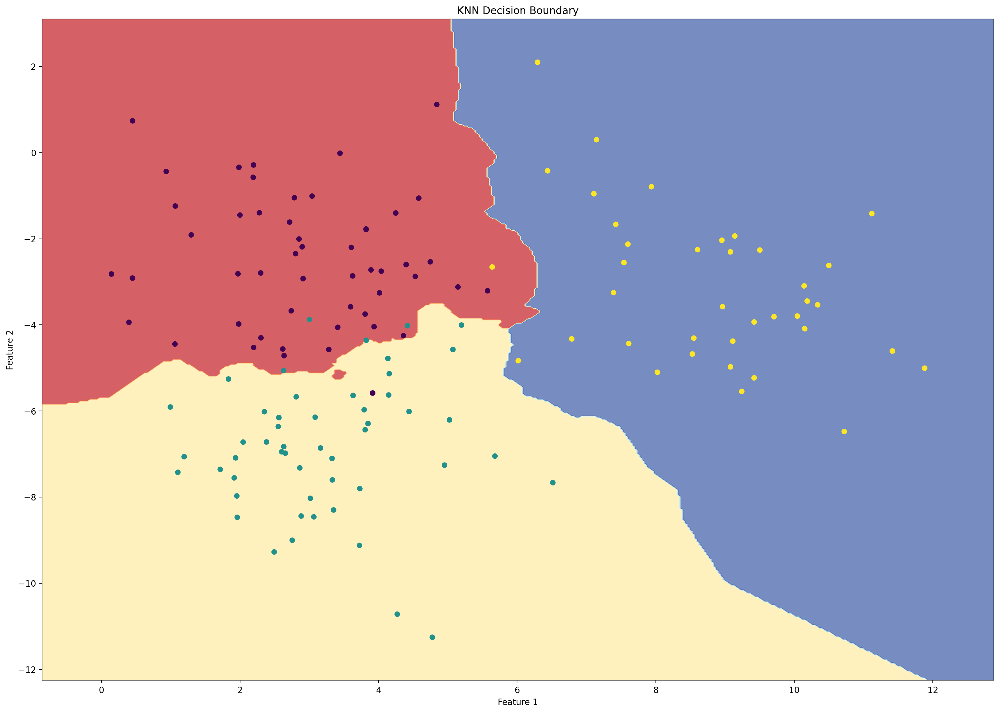

In [14]:
import numpy as np
import matplotlib.pyplot as plt

# Create a mesh grid of points
x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 400), np.linspace(y_min, y_max, 400))

# Flatten the grid to pass to the classifier
grid_points = np.c_[xx.ravel(), yy.ravel()]

# Train the KNN classifier
knn_naive = KNN_naive()
knn_naive.fit(X_train, y_train)

# Predict for all grid points
preds = knn_naive.predict(grid_points)

# Reshape the predictions back to the shape of the mesh grid
preds = preds.reshape(xx.shape)


plt.figure(figsize=(20,14))
# Plot the decision boundary
plt.contourf(xx, yy, preds, alpha=0.7, cmap=plt.cm.RdYlBu)

# Plot the training points
plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap='viridis', s=30)

plt.title("KNN Decision Boundary")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.show()


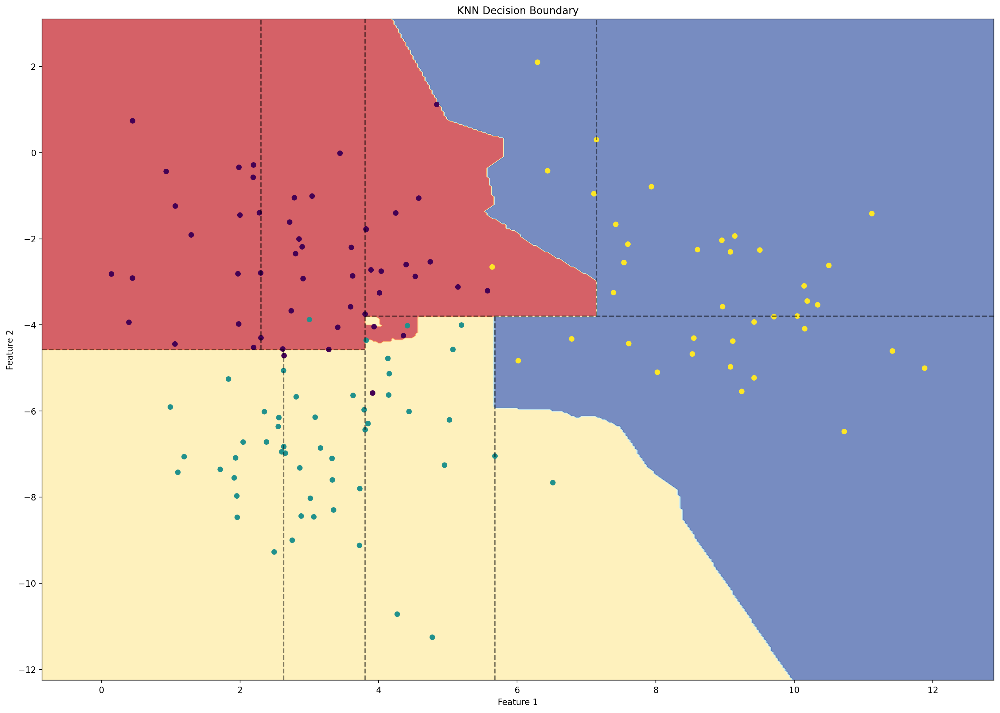

In [15]:
import numpy as np
import matplotlib.pyplot as plt

# Create a mesh grid of points
x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 400), np.linspace(y_min, y_max, 400))

# Flatten the grid to pass to the classifier
grid_points = np.c_[xx.ravel(), yy.ravel()]

# Train the KNN classifier
knn_kd = KNN_KD()
knn_kd.fit(X_train, y_train)

# Predict for all grid points
preds = knn_kd.predict(grid_points)

# Reshape the predictions back to the shape of the mesh grid
preds = preds.reshape(xx.shape)




def plot_classifier_lines(node, x_start, x_end, y_start, y_end, axis=0):
    if node.left is None and node.right is None:
        return
    if axis == 0:
        plt.plot([node.value, node.value], [y_start, y_end],c='black',alpha=0.5,linestyle='--')
        plot_classifier_lines(node.left, x_start, node.value, y_start, y_end, axis=(axis + 1) % 2)
        plot_classifier_lines(node.right, node.value, x_end, y_start, y_end, axis=(axis + 1) % 2)
        
    else:
        plt.plot([x_start, x_end], [node.value, node.value],c='black',alpha=0.5,linestyle='--')
        plot_classifier_lines(node.left, x_start, x_end, y_start, node.value, axis=(axis + 1) % 2)
        plot_classifier_lines(node.right, x_start, x_end, node.value, y_end, axis=(axis + 1) % 2)
    
    
plt.figure(figsize=(20,14))

# Plot the decision boundary
plt.contourf(xx, yy, preds, alpha=0.7, cmap=plt.cm.RdYlBu)

# Plot the training points
plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap='viridis', s=30)

plot_classifier_lines(knn_kd.tree.tree,x_min,x_max,y_min,y_max)

plt.title("KNN Decision Boundary")
plt.xlim(x_min,x_max)
plt.ylim(y_min,y_max)
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.show()


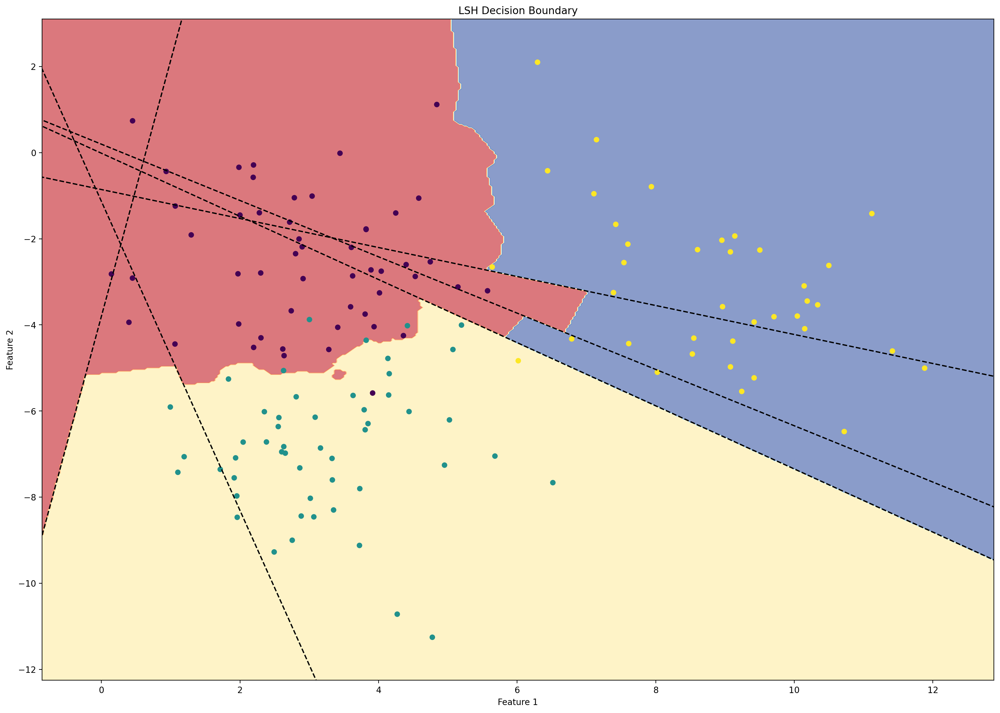

In [24]:
import numpy as np
import matplotlib.pyplot as plt


# Create a mesh grid of points
x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 400), np.linspace(y_min, y_max, 400))

# Flatten the grid to pass to the classifier
grid_points = np.c_[xx.ravel(), yy.ravel()]
# grid_points_line = np.c_[np.array(1),xx.ravel(), yy.ravel()]

# Train the KNN classifier
planes = 5
lsh = LSH(n_planes=planes,mean=5,std=10)
lsh.fit(X_train, y_train)

# Predict for all grid points
preds = lsh.predict(grid_points)

# Reshape the predictions back to the shape of the mesh grid
preds = preds.reshape(xx.shape)


plt.figure(figsize=(20,14))

weights = lsh.weights
for i in range(planes):
    b1, w1, w2 = weights[:,i]
    x1_values = np.linspace(-100, 100, 400)
    x2_values = - (w1 / w2) * x1_values - (b1 / w2)
    plt.plot(x1_values, x2_values,c="black",linestyle='--')


# Plot the decision boundary
plt.contourf(xx, yy, preds, alpha=0.6, cmap=plt.cm.RdYlBu)

# Plot the training points
plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap='viridis', s=30)

plt.title("LSH Decision Boundary")
plt.xlim(x_min,x_max)
plt.ylim(y_min,y_max)
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.show()


